# AudioPrompt Prototype (Notebook)

This notebook prototypes a simple workflow:
1) Analyze an input audio file (view waveform + spectrogram, build profile).
2) Generate a shaped pink-noise prompt from the analysis (preview + download).
3) Prepend the prompt to the original seed (preview + download).

Notes:
- Playback uses the Jupyter audio widget; ensure your browser allows audio.
- Set `INPUT_AUDIO` to a file path you have on disk (WAV/FLAC/OGG supported).
- Outputs are written under `notebook_outputs/`.
- This notebook imports utilities from `audioprompt.py` in this folder.

In [15]:
%matplotlib inline
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from IPython.display import Audio, FileLink, display
import soundfile as sf
from scipy import signal

import importlib
import audioprompt as ap
importlib.reload(ap)  # in case you edit the module

<module 'audioprompt' from '/Users/raymondwolt/scripts/audioprompt/audioprompt.py'>

In [25]:
# Configuration
INPUT_AUDIO = "/Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav"  # <- set this to your file
SR = 48000  # analysis / synthesis sample rate
BANDS = 1024  # detailed profile resolution
MAX_GAIN_DB = 6.0  # prompt shaping strength (dB)
PROMPT_SECONDS = 6.0
OUT_DIR = Path('notebook_outputs')
OUT_DIR.mkdir(exist_ok=True)
PROMPT_PATH = OUT_DIR / 'prompt.wav'
PREPENDED_PATH = OUT_DIR / 'prepended.wav'

INPUT_AUDIO = str(Path(INPUT_AUDIO).expanduser())
print('Input:', INPUT_AUDIO)
print('Outputs ->', OUT_DIR)

Input: /Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav
Outputs -> notebook_outputs


In [26]:
# Helpers
def plot_waveform(y, sr, title="Waveform"):
    t = np.arange(len(y)) / sr
    plt.figure(figsize=(10, 2.5))
    plt.plot(t, y, linewidth=0.8)
    plt.xlabel('Time (s)'); plt.ylabel('Amplitude'); plt.title(title); plt.tight_layout(); plt.show()

def plot_spectrogram(y, sr, title="Spectrogram"):
    nper = 1024
    nover = int(nper * 0.75)
    f, t, Sxx = signal.spectrogram(y, fs=sr, window='hann', nperseg=nper, noverlap=nover, scaling='spectrum', detrend=False)
    Sxx_db = 10 * np.log10(np.maximum(Sxx, 1e-20))
    plt.figure(figsize=(10, 3))
    plt.pcolormesh(t, f, Sxx_db, shading='auto', cmap='magma')
    plt.yscale('log'); plt.ylim([20, sr/2])
    plt.colorbar(label='dB')
    plt.xlabel('Time (s)'); plt.ylabel('Frequency (Hz)'); plt.title(title); plt.tight_layout(); plt.show()

def plot_profile(values_0_255, sr=SR, fmin=20.0):
    values = np.asarray(values_0_255, dtype=float)
    fmax = sr / 2
    freqs = np.logspace(np.log10(fmin), np.log10(fmax), len(values))
    plt.figure(figsize=(10, 2.5))
    plt.semilogx(freqs, values, linewidth=1.0)
    plt.xlabel('Frequency (Hz, log)'); plt.ylabel('0..255'); plt.title('Long-term Spectrum Profile'); plt.tight_layout(); plt.show()

def play_array(y, sr, title=""):
    if y.ndim == 1:
        display(Audio(y, rate=sr))
    else:
        # IPython Audio supports (n_samples, n_channels) arrays
        display(Audio(y.T, rate=sr))
    if title:
        print(title)

In [27]:
from pathlib import Path
import os, sys

p = Path(INPUT_AUDIO)
print("Path:", p)
print("repr:", repr(str(p)))
print("exists:", p.exists(), "is_file:", p.is_file(), "is_symlink:", p.is_symlink())
try:
    st = p.stat()
    print("size:", st.st_size, "bytes")
except Exception as e:
    print("stat error:", e)

print("Readable:", os.access(p, os.R_OK))
try:
    with open(p, "rb") as f:
        head = f.read(64)
        print("open() ok; first 12 bytes:", head[:12])
except Exception as e:
    print("builtin open error:", repr(e))

try:
    import wave
    with wave.open(str(p), "rb") as w:
        print("wave ok:", dict(
            channels=w.getnchannels(),
            rate=w.getframerate(),
            sampwidth=w.getsampwidth(),
            frames=w.getnframes()
        ))
except Exception as e:
    print("wave error:", repr(e))

try:
    import soundfile as sf
    print("soundfile info:", sf.info(str(p)))
except Exception as e:
    print("soundfile info error:", repr(e))


Path: /Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav
repr: '/Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav'
exists: True is_file: True is_symlink: False
size: 6299692 bytes
Readable: True
open() ok; first 12 bytes: b'RIFF$ `\x00WAVE'
wave ok: {'channels': 2, 'rate': 48000, 'sampwidth': 2, 'frames': 1574912}
soundfile info: /Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav
samplerate: 48000 Hz
channels: 2
duration: 32.811 s
format: WAV (Microsoft) [WAV]
subtype: Signed 16 bit PCM [PCM_16]


In [28]:
from pathlib import Path
import soundfile as sf

p = Path(INPUT_AUDIO)
data, sr = sf.read(str(p), always_2d=True, dtype="float32")
print("sf.read shape:", data.shape, "sr:", sr)


sf.read shape: (1574912, 2) sr: 48000


Loaded input: /Users/raymondwolt/Documents/audioprompt_test/rock_back_beat/Heavy Integrity.wav, samples=1574912, sr=48000


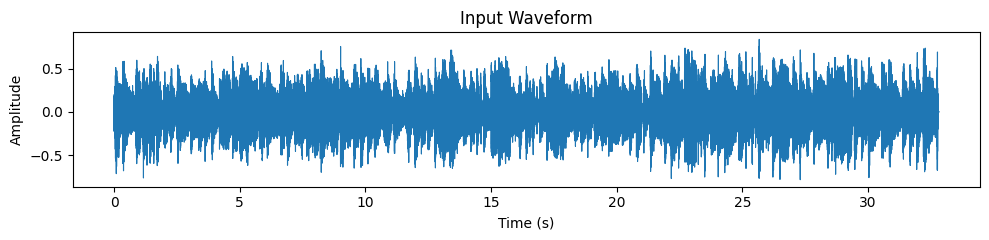

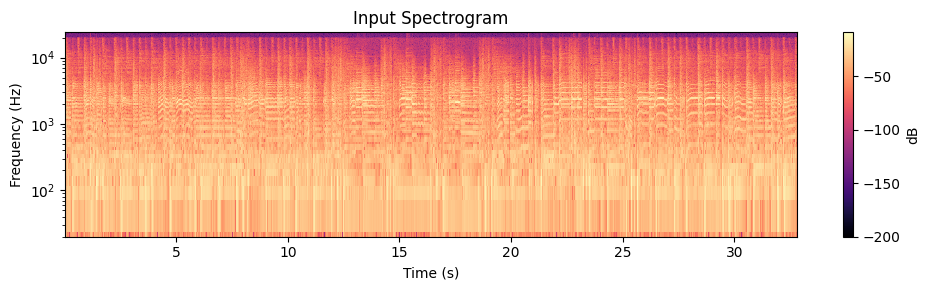

Input preview


In [29]:
# Step 1: Load input, show waveform + spectrogram + audio
x, sr_in = ap._load_audio_mono(Path(INPUT_AUDIO), SR)
print(f'Loaded input: {INPUT_AUDIO}, samples={len(x)}, sr={sr_in}')
plot_waveform(x, sr_in, 'Input Waveform')
plot_spectrogram(x, sr_in, 'Input Spectrogram')
play_array(x, sr_in, 'Input preview')

Average (0..255): 203.71


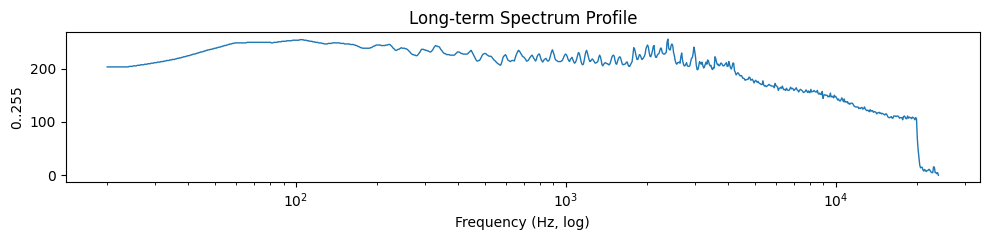

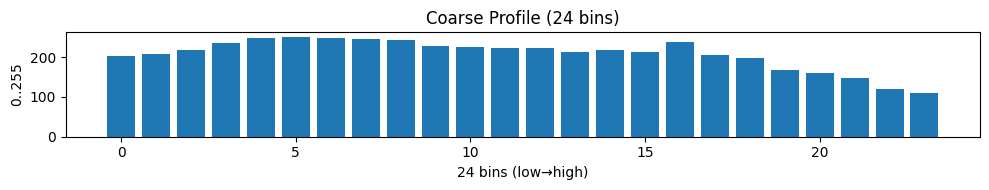

In [30]:
# Step 2: Analyze profile (Welch PSD -> 1D log-spaced profile)
res = ap.analyze_profile(Path(INPUT_AUDIO), bands=BANDS, bins=24, sr=SR)
print('Average (0..255):', round(res.avg, 2))
plot_profile(res.values_0_255, sr=SR)
# Also show the 24 coarse values that drive the EQ/inverse curve
coarse = [res.values_0_255[int(b * len(res.values_0_255) / 24)] for b in range(24)]
plt.figure(figsize=(10, 2))
plt.bar(np.arange(24), coarse)
plt.xlabel('24 bins (low→high)'); plt.ylabel('0..255'); plt.title('Coarse Profile (24 bins)'); plt.tight_layout(); plt.show()

Wrote notebook_outputs/prompt.wav


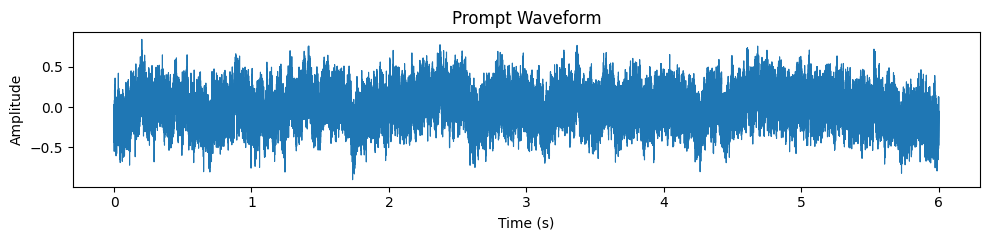

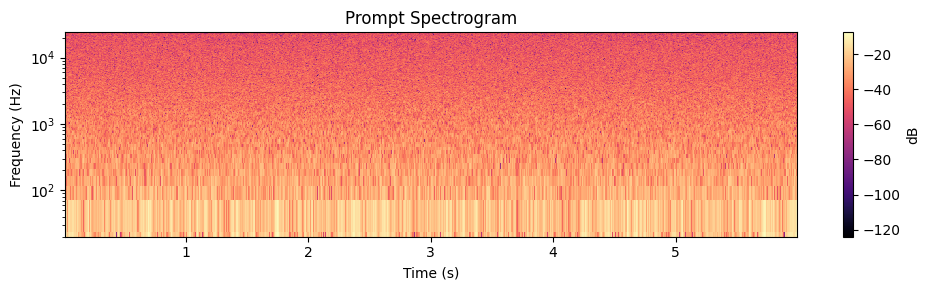

Prompt preview


/Users/raymondwolt/scripts/audioprompt/notebook_outputs/prompt.wav

In [31]:
# Step 3: Generate shaped pink-noise prompt
ap.generate_prompt(Path(INPUT_AUDIO), PROMPT_PATH, duration=PROMPT_SECONDS, max_gain=MAX_GAIN_DB, sr=SR, channels=1)
print('Wrote', PROMPT_PATH)
y_prompt, sr_p = sf.read(str(PROMPT_PATH), dtype='float32')
if y_prompt.ndim > 1:
    y_prompt = y_prompt[:,0]
plot_waveform(y_prompt, sr_p, 'Prompt Waveform')
plot_spectrogram(y_prompt, sr_p, 'Prompt Spectrogram')
play_array(y_prompt, sr_p, 'Prompt preview')
display(FileLink(PROMPT_PATH, result_html_prefix='Download: '))

Wrote notebook_outputs/prepended.wav


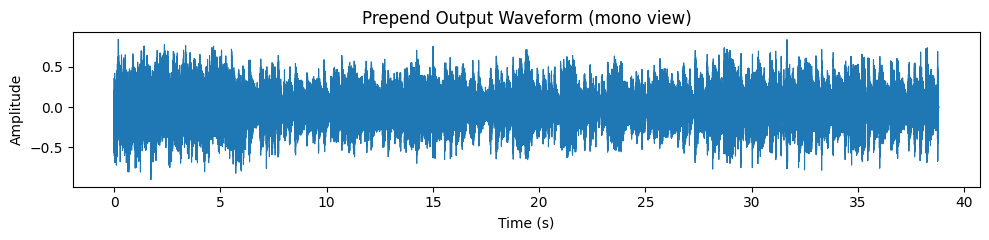

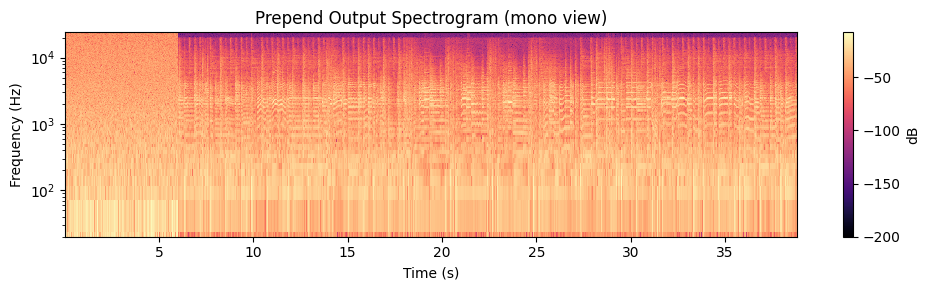

Prepend output preview (stereo if available)


/Users/raymondwolt/scripts/audioprompt/notebook_outputs/prepended.wav

In [32]:
# Step 4: Prepend prompt + seed
ap.prepend_audio(PROMPT_PATH, Path(INPUT_AUDIO), PREPENDED_PATH, sr=SR, channels=2)
print('Wrote', PREPENDED_PATH)
y_out, sr_o = sf.read(str(PREPENDED_PATH), dtype='float32')
# Convert to mono view for plotting if stereo
y_plot = y_out.mean(axis=1) if y_out.ndim == 2 else y_out
plot_waveform(y_plot, sr_o, 'Prepend Output Waveform (mono view)')
plot_spectrogram(y_plot, sr_o, 'Prepend Output Spectrogram (mono view)')
play_array(y_out, sr_o, 'Prepend output preview (stereo if available)')
display(FileLink(PREPENDED_PATH, result_html_prefix='Download: '))

In [ ]:
# One-cell demo: randomized scale melody imprint onto pink noise
# If needed first: %pip install scipy

import numpy as np
from scipy.signal import stft, istft
from IPython.display import Audio, display

# ---------- Utils ----------
def midi_to_hz(m): 
    m = np.asarray(m, dtype=float)
    return 440.0 * (2.0 ** ((m - 69.0) / 12.0))

def pink_noise(n, sr, seed=None):
    rng = np.random.default_rng(seed)
    X = np.fft.rfft(rng.standard_normal(n))
    f = np.fft.rfftfreq(n, 1/sr)
    X[1:] /= np.sqrt(np.maximum(f[1:], 1e-6))
    y = np.fft.irfft(X, n)
    y /= np.max(np.abs(y) + 1e-12)
    return y.astype(np.float32)

def imprint_melody(noise, sr, f0_hz, gain=8.0, harmonics=10, bw_frac=0.01, n_fft=2048):
    hop = n_fft // 4
    f, t, Z = stft(noise, fs=sr, nperseg=n_fft, noverlap=n_fft-hop, boundary=None)
    mag, ph = np.abs(Z), np.angle(Z)

    if np.isscalar(f0_hz):
        f0_traj = np.full_like(t, float(f0_hz))
    else:
        f0_time = np.linspace(0, len(noise)/sr, num=len(f0_hz), endpoint=False)
        f0_traj = np.interp(t, f0_time, f0_hz)

    for i, f0 in enumerate(f0_traj):
        if f0 <= 0 or not np.isfinite(f0):
            continue
        mask = np.zeros_like(f)
        for k in range(1, harmonics+1):
            fk = k * f0
            if fk > f[-1]: break
            bw = bw_frac * fk
            mask += np.exp(-0.5 * ((f - fk) / (bw + 1e-6))**2)
        if mask.max() > 0:
            mask = 1.0 + (gain * (mask / mask.max()))
            mag[:, i] *= mask

    _, y = istft(mag * np.exp(1j * ph), fs=sr, nperseg=n_fft, noverlap=n_fft-hop, boundary=None)
    y = y[:len(noise)]
    y /= np.max(np.abs(y) + 1e-12)
    return y.astype(np.float32)

SCALES = {
    "major": [0,2,4,5,7,9,11],
    "natural_minor": [0,2,3,5,7,8,10],
    "dorian": [0,2,3,5,7,9,10],
    "mixolydian": [0,2,4,5,7,9,10],
    "pentatonic": [0,3,5,7,10],
    "harmonic_minor": [0,2,3,5,7,8,11],
}

NOTE_TO_MIDI = {
    "C":60,"C#":61,"Db":61,"D":62,"D#":63,"Eb":63,"E":64,"F":65,"F#":66,"Gb":66,
    "G":67,"G#":68,"Ab":68,"A":69,"A#":70,"Bb":70,"B":71
}

def build_scale_pitches(root="C", octave=4, scale="major", low_midi=48, high_midi=84):
    root_midi = NOTE_TO_MIDI[root] + 12*(octave-4)
    pattern = [p % 12 for p in SCALES[scale]]
    allowed = [m for m in range(low_midi, high_midi+1) if ((m - root_midi) % 12) in pattern]
    return np.array(allowed, dtype=int)

def generate_random_melody(duration_s, bpm=100, root="C", octave=4, scale="major",
                           low_midi=55, high_midi=79, step_bias=0.8,
                           leap_max_scale_steps=4, rest_prob=0.1,
                           durations_beats=(0.25, 0.5, 1.0), duration_probs=(0.25, 0.5, 0.25),
                           seed=None):
    rng = np.random.default_rng(seed)
    allowed = build_scale_pitches(root, octave, scale, low_midi, high_midi)
    if len(allowed) < 2: raise ValueError("Pitch set too small; adjust range/scale.")
    spb = 60.0 / bpm
    t, t_end = 0.0, duration_s
    events = []
    current_idx = rng.integers(0, len(allowed))
    while t < t_end - 1e-6:
        db = rng.choice(durations_beats, p=duration_probs)
        dur = min(db * spb, t_end - t)
        if rng.random() < rest_prob:
            events.append((t, t+dur, None))
        else:
            if rng.random() < step_bias:
                step = rng.choice([-1, 1])
                ni = np.clip(current_idx + step, 0, len(allowed)-1)
            else:
                leap = rng.integers(-leap_max_scale_steps, leap_max_scale_steps+1)
                if leap == 0: leap = rng.choice([-1, 1])
                ni = np.clip(current_idx + leap, 0, len(allowed)-1)
            current_idx = int(ni)
            events.append((t, t+dur, int(allowed[current_idx])))
        t += dur
    return events

def events_to_f0(events, sr, n_samples, glide_prob=0.25, glide_frac=0.35,
                 vibrato_hz=5.5, vibrato_depth=0.02, seed=None):
    rng = np.random.default_rng(seed)
    t = np.arange(n_samples)/sr
    f0 = np.zeros(n_samples, dtype=float)
    for i, (t0, t1, midi) in enumerate(events):
        s0, s1 = int(round(t0*sr)), int(round(t1*sr))
        if s0 >= n_samples: break
        s1 = min(s1, n_samples)
        if midi is None: continue
        f_curr = midi_to_hz(midi)
        next_midi = events[i+1][2] if (i+1) < len(events) else None
        if next_midi is not None and rng.random() < glide_prob:
            f_next = midi_to_hz(next_midi)
            g_len = max(1, int((s1 - s0) * glide_frac))
            if s0 + g_len <= s1:
                f0[s0:s0+g_len] = np.linspace(f_curr, f_next, g_len, endpoint=False)
                f0[s0+g_len:s1]   = f_next
            else:
                f0[s0:s1] = np.linspace(f_curr, f_next, s1 - s0, endpoint=False)
        else:
            f0[s0:s1] = f_curr
    mask = f0 > 0
    f0[mask] *= 1.0 + vibrato_depth * np.sin(2*np.pi*vibrato_hz * t[mask])
    if n_samples > 2048:
        win = np.hanning(513); win /= win.sum()
        f0 = np.convolve(f0, win, mode='same')
    return f0

# ---------- Generate ----------
sr = 48000
dur_s = 6.0
seed = 0
n = int(sr * dur_s)
x_pink = pink_noise(n, sr, seed=seed)

events = generate_random_melody(
    duration_s=dur_s,
    bpm=96,
    root="C",
    octave=4,
    scale="pentatonic",     # try: major, natural_minor, pentatonic, etc.
    low_midi=55,
    high_midi=79,
    step_bias=0.8,
    leap_max_scale_steps=4,
    rest_prob=0.12,
    durations_beats=(0.25, 0.5, 1.0),
    duration_probs=(0.25, 0.5, 0.25),
    seed=seed,
)

f0 = events_to_f0(events, sr, n_samples=n, glide_prob=0.25, glide_frac=0.35,
                  vibrato_hz=5.5, vibrato_depth=0.02, seed=seed)
y_prompt = imprint_melody(x_pink, sr, f0_hz=f0, gain=8.0, harmonics=10, bw_frac=0.01)

print(f"Generated {len(y_prompt)} samples at {sr} Hz; events: {len(events)}")
display(Audio(y_prompt, rate=sr))


Generated 288000 samples at 48000 Hz; events: 19


/var/folders/43/1vlytq511dz3l3380hv0szwh0000gn/T/ipykernel_13576/1910140585.py:46: UserWarning: NOLA condition failed, STFT may not be invertible. Possibly due to missing boundary
  _, y = istft(mag * np.exp(1j * ph), fs=sr, nperseg=n_fft, noverlap=n_fft-hop, boundary=None)


In [34]:
def events_to_f0(
    events, sr, n_samples,
    glide_prob=0.2,    # chance to slide into next note
    glide_frac=0.3,    # portion of note spent gliding
    vibrato_hz=5.5,
    vibrato_depth=0.02,# 2% depth
    seed=None
):
    rng = np.random.default_rng(seed)
    t = np.arange(n_samples)/sr
    f0 = np.zeros(n_samples, dtype=float)

    # Fill per event, optionally glide to next pitch
    for i, (t0, t1, midi) in enumerate(events):
        s0 = int(np.round(t0*sr))
        s1 = int(np.round(t1*sr))
        if s0 >= n_samples:
            break
        s1 = min(s1, n_samples)
        if midi is None:
            continue
        f_curr = midi_to_hz(midi)
        next_midi = events[i+1][2] if (i+1) < len(events) else None

        if next_midi is not None and rng.random() < glide_prob:
            f_next = midi_to_hz(next_midi)
            g_len = int((s1 - s0) * glide_frac)
            g_len = max(1, g_len)
            # glide then sustain
            if s0 + g_len <= s1:
                f0[s0:s0+g_len] = np.linspace(f_curr, f_next, g_len, endpoint=False)
                f0[s0+g_len:s1] = f_next
            else:
                f0[s0:s1] = np.linspace(f_curr, f_next, s1 - s0, endpoint=False)
        else:
            f0[s0:s1] = f_curr

    # Add vibrato only where f0>0
    mask = f0 > 0
    f0[mask] *= 1.0 + vibrato_depth * np.sin(2*np.pi*vibrato_hz * t[mask])

    # Smooth f0 a touch to reduce discontinuities
    if n_samples > 2048:
        win = np.hanning(513)
        win /= win.sum()
        f0 = np.convolve(f0, win, mode='same')

    return f0
